# **Avaliação 02 - ENGA74 2023.1**
**Aluno:** André Paiva Conrado Rodrigues

## **Importação de dependências para os códigos**

In [28]:
import numpy as np
from scipy.stats import uniform, norm, expon, skew, kurtosis
from numpy.random import rand, randn, exponential
import pandas as pd
from PIL import Image
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## **Funções para variáveis aleatórias**

In [29]:
# Plot de histogramas
def plot_histogramas(uniforme, normal, exponencial):
    fig = make_subplots(rows=1, cols=3)

    fig.add_trace(go.Histogram(x=uniforme, name="Uniforme"), row=1, col=1)
    fig.add_trace(go.Histogram(x=normal, name="Normal"), row=1, col=2)
    fig.add_trace(go.Histogram(x=exponencial, name="Exponencial"), row=1, col=3)

    title = "Histogramas das variáveis aleatórias - " + \
            str(uniforme.shape[0]) + " realizações"

    fig.update_layout(title_text = title)
    fig.show()

In [30]:
# Dataframe de comparação
def compara_metricas(va, dist):
    df_compare = pd.DataFrame()

    if(dist.lower() == 'uniforme'):
        mean, var, sk, kurt = uniform.stats(moments='mvsk')
    elif(dist.lower() == 'normal'):
        mean, var, sk, kurt = norm.stats(moments='mvsk')
    elif(dist.lower() == 'exponencial'):
        mean, var, sk, kurt = expon.stats(moments='mvsk')
    else:
        mean, var, sk, kurt = uniform.stats(moments='mvsk')

    df_compare['Valores'] = ['Calculado', 'Esperado']
    df_compare['Média'] = np.array([np.mean(va), mean])
    df_compare['Variância'] = np.array([np.var(va), var])
    df_compare['Assimetria'] = np.array([skew(va), sk])
    df_compare['Curtose'] = np.array([kurtosis(va), kurt])

    return df_compare

In [31]:
# Plot de modelo de distribuição e histograma normalizado
def plot_distribuicoes(uniforme, normal, exponencial):
    pdf_uni_sample = np.linspace(uniform.ppf(0.01), uniform.ppf(0.99), 100)
    pdf_norm_sample = np.linspace(norm.ppf(0.01), norm.ppf(0.99), 100)
    pdf_exp_sample = np.linspace(expon.ppf(0.01), expon.ppf(0.99), 100)

    fig = make_subplots(rows=1, cols=3)

    fig.add_trace(go.Histogram(x=uniforme, histnorm='probability density',
                            name="Dados unif."), row=1, col=1)
    fig.add_trace(go.Histogram(x=normal, histnorm='probability density',
                            name="Dados normal"), row=1, col=2)
    fig.add_trace(go.Histogram(x=exponencial, histnorm='probability density',
                                name="Dados expon."), row=1, col=3)

    fig.add_trace(go.Scatter(x=pdf_uni_sample, y=uniform.pdf(pdf_uni_sample),
                        name='Modelo unif.', mode='lines',
                        marker=dict(color="rgba(0, 255, 190, 0.8)")), row=1, col=1)
    fig.add_trace(go.Scatter(x=pdf_norm_sample, y=norm.pdf(pdf_norm_sample),
                        name='Modelo normal', mode='lines',
                        marker=dict(color="rgba(0, 0, 167, 0.8)")), row=1, col=2)
    fig.add_trace(go.Scatter(x=pdf_exp_sample, y=expon.pdf(pdf_exp_sample),
                        name='Modelo expon.', mode='lines',
                        marker=dict(color="rgba(190, 0, 212, 0.8)")), row=1, col=3)

    title = "Ajustes de modelos de distribuição - " + \
            str(uniforme.shape[0]) + " realizações"

    fig.update_layout(title_text = title)
    fig.show()

## **Funções para processamento de imagem**

In [32]:
# Importa imagem e converte para P&B
def importa_imagem():
    imagem = Image.open(r"av02-img/img01.jpg")
    imagem = imagem.convert('L')

    return imagem

In [33]:
# Crop da imagem
def crop_imagem(imagem, w_percent=0.5, h_percent=0.5):
    orig_width, orig_height = imagem.size

    cutout = [40, 50]
    crop_centerpoint = [w_percent*orig_width, h_percent*orig_height]
    left = crop_centerpoint[0] - (cutout[0]/2)
    right = crop_centerpoint[0] + (cutout[0]/2)
    up = crop_centerpoint[1] - (cutout[1]/2)
    down = crop_centerpoint[1] + (cutout[1]/2)

    imagem_crop = imagem.crop((left, up, right, down))
    return imagem_crop

In [34]:
# Exibição da matriz de correlação

def corr_imagem(imagem):
    corr_img = make_subplots(rows=1, cols=2)
    imagem_plot = imagem.convert('RGB')
    img_array = np.array(imagem)
    corr_img.add_trace(go.Image(z=imagem_plot), row=1, col=1)
    corr_matrix = np.corrcoef(img_array)
    corr_img.add_trace(go.Heatmap(z=corr_matrix, colorscale='BrBG', dy=-1,
                                  y0 = img_array.shape[0], zmax=1, zmin=-1),
                         row=1, col=2)
    corr_img.update_layout(title_text = 'Matriz de correlação do recorte de imagem')
    corr_img.show()

## **Variável aleatória - 1000 realizações**

Geração de variáveis aleatórias nas distribuições uniforme (`var_uni`), normal (`var_norm`) e exponencial (`var_exp`):

In [35]:
var_uni_1000 = rand(1000)
var_norm_1000 = randn(1000)
var_exp_1000 = exponential(size=1000)

Histogramas:

In [36]:
plot_histogramas(var_uni_1000, var_norm_1000, var_exp_1000)

Métricas das variáveis aleatórias na distribuição uniforme:

In [37]:
compara_metricas(var_uni_1000, 'uniforme')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.502215,0.084321,-0.059467,-1.234149
1,Esperado,0.500000,0.083333,0.000000,-1.200000


Métricas das variáveis aleatórias na distribuição normal:

In [38]:
compara_metricas(var_norm_1000, 'normal')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,-0.025316,1.027388,-0.093931,-0.122129
1,Esperado,0.000000,1.000000,0.000000,0.000000


Métricas das variáveis aleatórias na distribuição exponencial:

In [39]:
compara_metricas(var_exp_1000, 'exponencial')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.994844,0.937336,1.944738,5.30267
1,Esperado,1.000000,1.000000,2.000000,6.00000


Ajuste de modelo de distribuição de probabilidade:

In [40]:
plot_distribuicoes(var_uni_1000, var_norm_1000, var_exp_1000)

## **Variável aleatória - 10000 realizações**

Geração de variáveis aleatórias nas distribuições uniforme (`var_uni`), normal (`var_norm`) e exponencial (`var_exp`):

In [41]:
var_uni_10000 = rand(10000)
var_norm_10000 = randn(10000)
var_exp_10000 = exponential(size=10000)

Histogramas:

In [42]:
plot_histogramas(var_uni_10000, var_norm_10000, var_exp_10000)

Métricas das variáveis aleatórias na distribuição uniforme:

In [43]:
compara_metricas(var_uni_10000, 'uniforme')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.499063,0.084048,0.003248,-1.207982
1,Esperado,0.500000,0.083333,0.000000,-1.200000


Métricas das variáveis aleatórias na distribuição normal:

In [44]:
compara_metricas(var_norm_10000, 'normal')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.002338,1.016527,0.000941,-0.054268
1,Esperado,0.000000,1.000000,0.000000,0.000000


Métricas das variáveis aleatórias na distribuição exponencial:

In [45]:
compara_metricas(var_exp_10000, 'exponencial')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.996756,0.978246,1.947137,5.62781
1,Esperado,1.000000,1.000000,2.000000,6.00000


Ajuste de modelo de distribuição de probabilidade:

In [46]:
plot_distribuicoes(var_uni_10000, var_norm_10000, var_exp_10000)

## **Variável aleatória - 100000 realizações**

Geração de variáveis aleatórias nas distribuições uniforme (`var_uni`), normal (`var_norm`) e exponencial (`var_exp`):

In [47]:
var_uni_100000 = rand(100000)
var_norm_100000 = randn(100000)
var_exp_100000 = exponential(size=100000)

Histogramas:

In [48]:
plot_histogramas(var_uni_100000, var_norm_100000, var_exp_100000)

Métricas das variáveis aleatórias na distribuição uniforme:

In [49]:
compara_metricas(var_uni_100000, 'uniforme')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.499311,0.083458,0.00615,-1.204117
1,Esperado,0.500000,0.083333,0.00000,-1.200000


Métricas das variáveis aleatórias na distribuição normal:

In [50]:
compara_metricas(var_norm_100000, 'normal')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,-0.000721,1.001107,0.013894,-0.024466
1,Esperado,0.000000,1.000000,0.000000,0.000000


Métricas das variáveis aleatórias na distribuição exponencial:

In [51]:
compara_metricas(var_exp_100000, 'exponencial')

,Valores,Média,Variância,Assimetria,Curtose
0,Calculado,0.999479,0.995561,2.027182,6.238044
1,Esperado,1.000000,1.000000,2.000000,6.000000


Ajuste de modelo de distribuição de probabilidade:

In [52]:
plot_distribuicoes(var_uni_100000, var_norm_100000, var_exp_100000)

## **Comparação de desempenho - Variáveis aleatórias**

Com os histogramas e os modelos de distribuição sobrepostos, é possível perceber uma melhora significativa na adaptação dos modelos aos dados com o aumento da quantidade de variáveis aleatórias. Além disso, com o aumento da quantidade de dados, percebe-se a diminuição do erro em relação aos valores esperados para as métricas (média, variância, assimetria e curtose).

## **Matriz de correlação a partir de imagem**

Imagem selecionada:

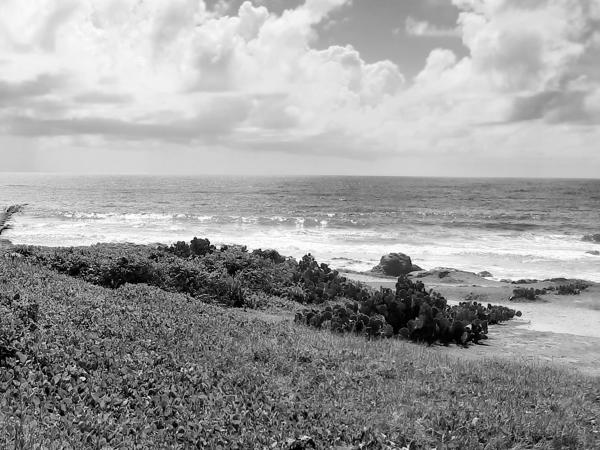

In [53]:
importa_imagem().resize([600, 450])

Cálculo da matriz de correlação:

In [54]:
img = importa_imagem()
img = crop_imagem(img, 0.6, 0.6)
corr_imagem(img)